In [ ]:
# after adding:
# except UnboundLocalError:
#     gm_params["reg_covar"] = _increase_reg(gm_params["reg_covar"])
#     continue
# to autogmm.py

In [3]:
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.metrics import adjusted_rand_score
# from sklearn.mixture import GaussianMixture

# from graspy.cluster import GaussianCluster, AutoGMMCluster
# from graspy.embed import AdjacencySpectralEmbed, LaplacianSpectralEmbed, selectSVD, select_dimension
# from graspy.plot import heatmap
# from src.hierarchy import signal_flow
from src.data import load_metagraph
from src.graph import preprocess
from src.visualization import plot_single_dendrogram, plot_color_labels
import os

import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.gridspec as gridspec

from scipy.io import mmread
import pyreadr

ModuleNotFoundError: No module named 'graspy'

In [56]:
rc_dict = {
    "axes.spines.right": False,
    "axes.spines.top": False,
    "axes.formatter.limits": (-3, 3),
    "figure.figsize": (6, 3),
    "figure.dpi": 100,
    "axes.edgecolor": "lightgrey",
    "ytick.color": "grey",
    "xtick.color": "grey",
    "axes.labelcolor": "dimgrey",
    "text.color": "dimgrey",
    "pdf.fonttype": 42,
    "ps.fonttype": 42,
    "font.family": "sans-serif",
    "font.sans-serif": ["Arial"],
}
for key, val in rc_dict.items():
    mpl.rcParams[key] = val
context = sns.plotting_context(context="talk", font_scale=3, rc=rc_dict)
# context = sns.plotting_context(context="talk", font_scale=1, rc=rc_dict)
sns.set_context(context)

## Clustering

In [3]:
!ln -s /Users/TingshanLiu/Desktop/2020 summer/TL_maggot/notebooks/RecursiveCluster_v4.py RecursiveCluster_v4.py
from RecursiveCluster_v4 import RecursiveCluster

usage: ln [-Ffhinsv] source_file [target_file]
       ln [-Ffhinsv] source_file ... target_dir
       link source_file target_file


In [4]:
path = "../../week1013/maggot_data"

In [5]:
# R hemi

# output from R
adj_R = mmread(path + '/adj_R.mtx').toarray()   
c_true_R = pd.read_csv(path + '/classes_R.csv')
c_true_R = c_true_R.to_numpy().reshape((len(c_true_R)))
Xhat_R = pd.read_csv(path + '/Xhat_R.csv')
Xhat_R = Xhat_R.iloc[:,1:].to_numpy()

# directly from agmm repo
# mb_r = pyreadr.read_r('/Users/TingshanLiu/Desktop/week0803/MBconnectome.rda')  
mb_R_claw = pyreadr.read_r(path + '/claw.rda') 
# x = pd.read_csv(path + '/Users/TingshanLiu/Desktop/week0803/embedded_right.csv').to_numpy()

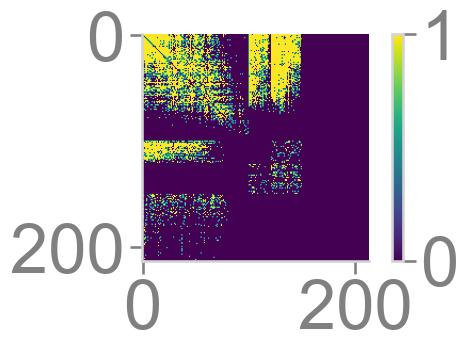

In [31]:
plt.imshow(adj_R)
plt.colorbar()

In [6]:
# L hemi

# output from R
adj_L = mmread(path + '/adj_L.mtx').toarray()   
c_true_L = pd.read_csv(path + '/classes_L.csv', index_col=0)  # these are strings of types
c_true_L = c_true_L.replace({'KC': 1, 'MBIN': 2, "MBON": 3, "PN": 4})
c_true_L = c_true_L.to_numpy().reshape((len(c_true_L)))
Xhat_L = pd.read_csv(path + '/Xhat_L.csv')
Xhat_L = Xhat_L.iloc[:,1:].to_numpy()

# directly from agmm repo
# mb_r = pyreadr.read_r('/Users/TingshanLiu/Desktop/week0803/MBconnectome.rda')  
# mb_R_claw = pyreadr.read_r(path + '/claw.rda') 
# x = pd.read_csv(path + '/Users/TingshanLiu/Desktop/week0803/embedded_right.csv').to_numpy()

In [72]:
# np.random.seed(8888)
# rc = RecursiveCluster(max_components=6, max_level=2)
# labels_R_mb2017 = rc.fit_predict(x)

self.depth = 0
len(X) 213
len(new_X) = 55
self.depth = 1
len(X) 55
len(new_X) = 14
len(new_X) = 18
len(new_X) = 19
len(new_X) = 4
len(new_X) = 28
self.depth = 1
len(X) 28
len(new_X) = 18
len(new_X) = 10
len(new_X) = 36
self.depth = 1
len(X) 36
len(new_X) = 4
len(new_X) = 5
len(new_X) = 5
len(new_X) = 2
len(new_X) = 16
len(new_X) = 4
len(new_X) = 28
self.depth = 1
len(X) 28
len(new_X) = 14
len(new_X) = 14
len(new_X) = 28
self.depth = 1
len(X) 28
len(new_X) = 8
len(new_X) = 5
len(new_X) = 5
len(new_X) = 4
len(new_X) = 4
len(new_X) = 2
len(new_X) = 38
self.depth = 1
len(X) 38
len(new_X) = 10
len(new_X) = 9
len(new_X) = 10
len(new_X) = 3
len(new_X) = 3
len(new_X) = 3


In [25]:
# np.allclose(Xhat_R, x, rtol=1.e-7, atol=1.e-7)

True

In [7]:
np.random.seed(8888)
rc = RecursiveCluster(max_components=6, max_level=2)
labels_R_mb2017 = rc.fit_predict(Xhat_R)

self.depth = 0
len(X) 213
len(new_X) = 55
self.depth = 1
len(X) 55
len(new_X) = 26
len(new_X) = 25
len(new_X) = 4
len(new_X) = 28
self.depth = 1
len(X) 28
len(new_X) = 18
len(new_X) = 10
len(new_X) = 36
self.depth = 1
len(X) 36
len(new_X) = 4
len(new_X) = 5
len(new_X) = 5
len(new_X) = 2
len(new_X) = 16
len(new_X) = 4
len(new_X) = 28
self.depth = 1
len(X) 28
len(new_X) = 14
len(new_X) = 14
len(new_X) = 28
self.depth = 1
len(X) 28
len(new_X) = 8
len(new_X) = 5
len(new_X) = 5
len(new_X) = 4
len(new_X) = 4
len(new_X) = 2
len(new_X) = 38
self.depth = 1
len(X) 38
len(new_X) = 10
len(new_X) = 9
len(new_X) = 10
len(new_X) = 3
len(new_X) = 3
len(new_X) = 3


In [32]:
np.random.seed(8888)
rc = RecursiveCluster(max_components=6, max_level=2)
labels_R_mb2017 = rc.fit_predict(Xhat_R)

self.depth = 0
len(X) 213
len(new_X) = 55
self.depth = 1
len(X) 55
len(new_X) = 26
len(new_X) = 25
len(new_X) = 4
len(new_X) = 28
self.depth = 1
len(X) 28
len(new_X) = 18
len(new_X) = 10
len(new_X) = 36
self.depth = 1
len(X) 36
len(new_X) = 4
len(new_X) = 5
len(new_X) = 5
len(new_X) = 2
len(new_X) = 16
len(new_X) = 4
len(new_X) = 28
self.depth = 1
len(X) 28
len(new_X) = 14
len(new_X) = 14
len(new_X) = 28
self.depth = 1
len(X) 28
len(new_X) = 8
len(new_X) = 5
len(new_X) = 5
len(new_X) = 4
len(new_X) = 4
len(new_X) = 2
len(new_X) = 38
self.depth = 1
len(X) 38
len(new_X) = 10
len(new_X) = 9
len(new_X) = 10
len(new_X) = 3
len(new_X) = 3
len(new_X) = 3


In [34]:
from graspy.models.sbm import _calculate_block_p, _block_to_full, _get_block_indices

In [75]:
single_label = labels_R_mb2017[:, 0]
_, counts = np.unique(single_label, return_counts=True)
block_weights = counts / adj_R.shape[0]
block_vert_inds, block_inds, block_inv = _get_block_indices(single_label)
block_p_R1 = _calculate_block_p(adj_R, block_inds, block_vert_inds)
p_mat_R1 = _block_to_full(block_p_R1, block_inv, adj_R.shape)

single_label = labels_R_mb2017[:, -1]
_, counts = np.unique(single_label, return_counts=True)
block_weights = counts / adj_R.shape[0]
block_vert_inds, block_inds, block_inv = _get_block_indices(single_label)
block_p_R2 = _calculate_block_p(adj_R, block_inds, block_vert_inds)
p_mat_R2 = _block_to_full(block_p_R2, block_inv, adj_R.shape)

In [76]:
single_label = labels_L_mb2017[:, 0]
_, counts = np.unique(single_label, return_counts=True)
block_weights = counts / adj_L.shape[0]
block_vert_inds, block_inds, block_inv = _get_block_indices(single_label)
block_p_L1 = _calculate_block_p(adj_L, block_inds, block_vert_inds)
p_mat_L1 = _block_to_full(block_p_L1, block_inv, adj_L.shape)

single_label = labels_L_mb2017[:, -1]
_, counts = np.unique(single_label, return_counts=True)
block_weights = counts / adj_L.shape[0]
block_vert_inds, block_inds, block_inv = _get_block_indices(single_label)
block_p_L2 = _calculate_block_p(adj_L, block_inds, block_vert_inds)
p_mat_L2 = _block_to_full(block_p_L2, block_inv, adj_L.shape)

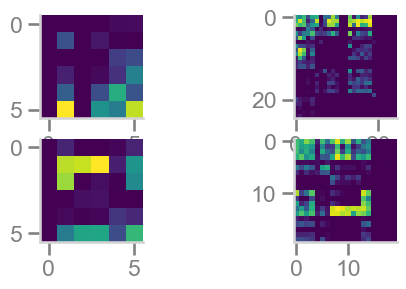

In [77]:
fig,axs = plt.subplots(2,2)
ax = axs[0,0]
ax.imshow(block_p_R1)
ax = axs[0,1]
ax.imshow(block_p_R2)
ax = axs[1,0]
ax.imshow(block_p_L1)
ax = axs[1,1]
ax.imshow(block_p_L2)

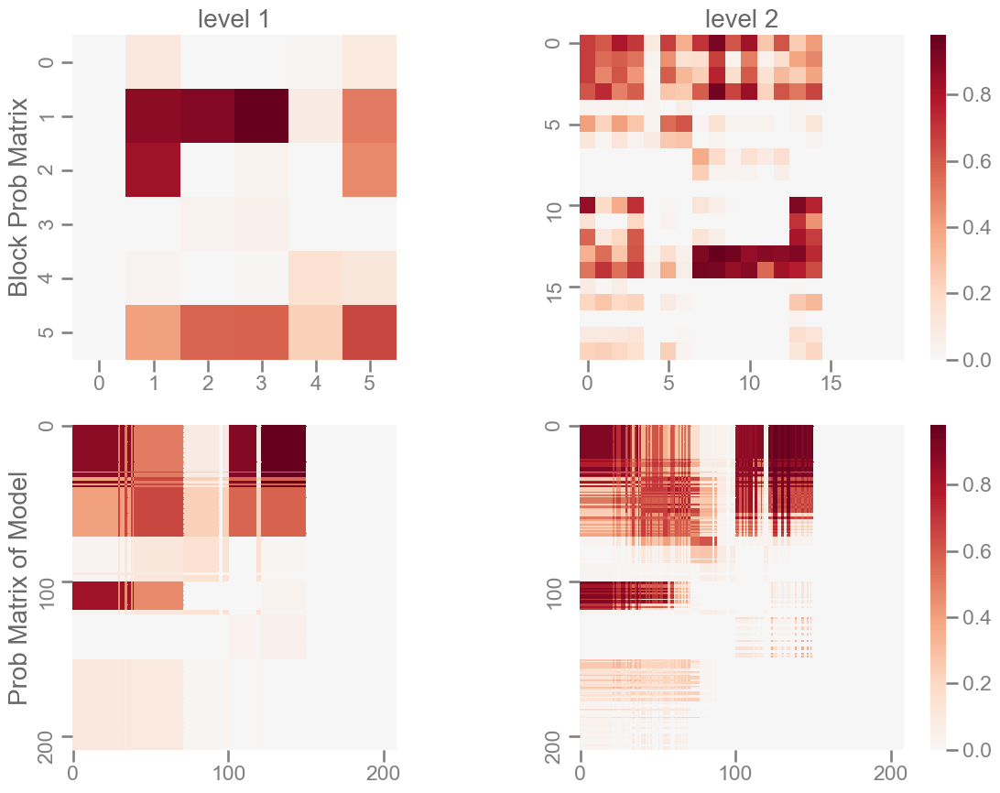

In [81]:
fig,axs = plt.subplots(2,2, figsize=(12,9))
# fig, ((ax1,ax2),(ax3,ax4)) = plt.subplots(2,2)
# axlist = [ax1, ax2, ax3, ax4]
ax = axs[0,0]
sns.heatmap(block_p_L1, cbar=False, square = True, cmap = 'RdBu_r', center=0, ax=ax)
ax.set_title("level 1", fontsize=20)
ax.set_ylabel("Block Prob Matrix", fontsize=20)
ax = axs[0,1]
sns.heatmap(block_p_L2, cbar=True, square = True, xticklabels=5, yticklabels=5, cmap = 'RdBu_r', center=0, ax=ax)
ax.set_title("level 2", fontsize=20)
ax = axs[1,0]
sns.heatmap(p_mat_L1, cbar=False, square = True, xticklabels=100, yticklabels=100, cmap = 'RdBu_r', center=0, ax=ax)
ax.set_ylabel("Prob Matrix of Model", fontsize=20)
ax = axs[1,1]
sns.heatmap(p_mat_L2, cbar=True, square = True, xticklabels=100, yticklabels=100, cmap = 'RdBu_r', center=0, ax=ax)
# fig.colorbar(im, ax=axs)
# cax,kw = mpl.colorbar.make_axes([ax for ax in axs.flat])
# plt.colorbar(im, cax=cax, **kw)
# fig.colorbar()
plt.tight_layout()
plt.savefig('1')

In [8]:
np.random.seed(8888)
rc = RecursiveCluster(max_components=6, max_level=2)
labels_L_mb2017 = rc.fit_predict(Xhat_L)

self.depth = 0
len(X) 209
len(new_X) = 36
self.depth = 1
len(X) 36
len(new_X) = 11
len(new_X) = 7
len(new_X) = 6
len(new_X) = 12
len(new_X) = 30
self.depth = 1
len(X) 30
len(new_X) = 10
len(new_X) = 6
len(new_X) = 14
len(new_X) = 29
self.depth = 1
len(X) 29
len(new_X) = 16
len(new_X) = 7
len(new_X) = 6
len(new_X) = 18
self.depth = 1
len(X) 18
len(new_X) = 5
len(new_X) = 4
len(new_X) = 9
len(new_X) = 36
self.depth = 1
len(X) 36
len(new_X) = 8
len(new_X) = 28
len(new_X) = 60
self.depth = 1
len(X) 60
len(new_X) = 12
len(new_X) = 7
len(new_X) = 17
len(new_X) = 8
len(new_X) = 16


In [42]:
np.random.seed(8888)
rc = RecursiveCluster(max_components=6, max_level=2)
labels_L_mb2017 = rc.fit_predict(Xhat_L)

self.depth = 0
len(X) 209
len(new_X) = 36
self.depth = 1
len(X) 36
len(new_X) = 11
len(new_X) = 7
len(new_X) = 6
len(new_X) = 12
len(new_X) = 30
self.depth = 1
len(X) 30
len(new_X) = 10
len(new_X) = 6
len(new_X) = 14
len(new_X) = 29
self.depth = 1
len(X) 29
len(new_X) = 16
len(new_X) = 7
len(new_X) = 6
len(new_X) = 18
self.depth = 1
len(X) 18
len(new_X) = 5
len(new_X) = 4
len(new_X) = 9
len(new_X) = 36
self.depth = 1
len(X) 36
len(new_X) = 8
len(new_X) = 28
len(new_X) = 60
self.depth = 1
len(X) 60
len(new_X) = 12
len(new_X) = 7
len(new_X) = 17
len(new_X) = 8
len(new_X) = 16


In [10]:
# check against agmm paper results

# agmm = AutoGMMCluster(min_components=1,max_components=6,random_state=0)
# c_hat = agmm.fit_predict(x)
# adjusted_rand_score(labels_R_mb2017[:,0], c_hat)

## predicted labels to meta

### R hemi

In [11]:
class_label = "class0"
meta_R = pd.DataFrame(np.zeros(len(c_true_R)))
meta_R[class_label] = ''
major_classes = ["KC", "MBIN", "MBON", "PN"]
for i in range(len(major_classes)):
    inds = np.where(c_true_R==i+1)[0]
    meta_R[class_label].iloc[inds] = major_classes[i]
del meta_R[0]

len_KC = np.sum(c_true_R==1)

In [12]:
mb_r_sub = pd.read_csv(path + '/out_vdf_v_R.csv')
mb_r_sub = mb_r_sub.loc[:, ~mb_r_sub.columns.str.contains('^Unnamed')]
mb_r_sub["inds"] = range(len(mb_r_sub))

In [13]:
mb_r_sub['Skeleton.ID'] = mb_r_sub['x'].iloc[:len_KC].str.split('#').str[1]
mb_r_sub['Skeleton.ID'].iloc[27] = '29' # b/c this neuron has 2 IDs: #0 & #29
mb_r_sub['Skeleton.ID'].iloc[:len_KC] = mb_r_sub['Skeleton.ID'].iloc[:len_KC].astype(int)
mb_r_sub['type'] = ''

In [14]:
mb_r_claw = pyreadr.read_r(path + '/claw.rda') 

In [15]:
for i in range(len_KC):
    inds = mb_r_claw['claw'].index[mb_r_claw['claw']['Skeleton.ID'] == mb_r_sub['Skeleton.ID'].iloc[i]].tolist()
    mb_r_sub['type'].iloc[i] = mb_r_claw['claw']['type'].iloc[inds[0]]

In [16]:
meta_R = pd.concat([meta_R, mb_r_sub['type']], axis=1) 
meta_R['type'].iloc[len_KC:] = meta_R['class0'].iloc[len_KC:]
meta_R["inds"] = range(len(meta_R))

In [17]:
def df_label(labels):
    # level 0
    l0 = np.zeros((len(labels),1))
    l0 = l0.astype(int).astype(str)

    # level 1
    l1 = np.empty((1,1))
    for i in range(len(labels)):
        new_label = str(0) + '-' + str(labels[i,0])
        l1 = np.append(l1, new_label)
    l1 = l1[1:]

    # level 2
    n_clus = np.max(labels[:,0]) + 1  # n_clus at level 1
    l2 = labels[:,1].copy().astype(str)
    for i in range(n_clus):
        inds = labels[:,0] == i
        indx = np.where(labels[:,0] == i)[0]
        single_clus = labels[:,1][indx]
        _, single_clus_label = np.unique(single_clus, return_inverse=True)
        n_unique = np.sum(inds)
        for j in range(n_unique):
            new_label = str(0) + '-' + str(i) + '-' + str(single_clus_label[j])
            l2[indx[j]] = new_label

    l = np.column_stack((l0, l1, l2))

    labels = pd.DataFrame(l.copy())
    labels.columns = ["lvl0_labels", "lvl1_labels", "lvl2_labels"]

    return labels

In [18]:
labels_R_mb2017 = df_label(labels_R_mb2017)

In [19]:
for i in range(3):
    meta_R[f"lvl{i}_labels"] = labels_R_mb2017[f"lvl{i}_labels"].values

In [20]:
lowest_level = 2
level_names = [f"lvl{i}_labels" for i in range(lowest_level + 1)]

# meta_R["sf"] = -signal_flow(adj_R)
sort_class = level_names + ['type']
# class_order = ["sf"]
total_sort_by = []
# for sc in sort_class:
#     for co in class_order:
#         class_value = meta_R.groupby(sc)[co].mean()
#         meta_R[f"{sc}_{co}_order"] = meta_R[sc].map(class_value)
#         total_sort_by.append(f"{sc}_{co}_order")
#     total_sort_by.append(sc)
for sc in sort_class:
        # class_value = meta_R.groupby(sc).mean()
        # meta_R[f"{sc}_{co}_order"] = meta_R[sc].map(class_value)
        # total_sort_by.append(f"{sc}_{co}_order")
    total_sort_by.append(sc)
meta_R = meta_R.sort_values(total_sort_by)

In [21]:
meta_R

,class0,type,inds,lvl0_labels,lvl1_labels,lvl2_labels
93,KC,young,93,0,0-0,0-0-0
97,KC,young,97,0,0-0,0-0-0
98,KC,young,98,0,0-0,0-0-0
179,PN,PN,179,0,0-0,0-0-1
180,PN,PN,180,0,0-0,0-0-1
...,...,...,...,...,...,...
57,KC,multi claw,57,0,0-5,0-5-2
24,KC,single claw,24,0,0-5,0-5-2
28,KC,single claw,28,0,0-5,0-5-2
34,KC,single claw,34,0,0-5,0-5-2


### L hemi

In [22]:
class_label = "class0"
meta_L = pd.DataFrame(np.zeros(len(c_true_L)))
meta_L[class_label] = ''
major_classes = ["KC", "MBIN", "MBON", "PN"]
for i in range(len(major_classes)):
    inds = np.where(c_true_L==i+1)[0]
    meta_L[class_label].iloc[inds] = major_classes[i]
del meta_L[0]

len_KC = np.sum(c_true_L==1)

In [23]:
mb_L_sub = pd.read_csv(path + '/out_vdf_v_L.csv')
mb_L_sub = mb_L_sub.loc[:, ~mb_L_sub.columns.str.contains('^Unnamed')]
mb_L_sub["inds"] = range(len(mb_L_sub))

In [24]:
mb_L_sub['Skeleton.ID'] = mb_L_sub['x'].iloc[:len_KC].str.split('#').str[1]
mb_L_sub['Skeleton.ID'].iloc[:len_KC] = mb_L_sub['Skeleton.ID'].iloc[:len_KC].astype(int)
mb_L_sub['type'] = ''

In [25]:
for i in range(len_KC):
    inds = mb_r_claw['claw'].index[mb_r_claw['claw']['Skeleton.ID'] == mb_L_sub['Skeleton.ID'].iloc[i]].tolist()
    mb_L_sub['type'].iloc[i] = mb_r_claw['claw']['type'].iloc[inds[0]]

In [26]:
meta_L = pd.concat([meta_L, mb_L_sub['type']], axis=1) 
meta_L['type'].iloc[len_KC:] = meta_L['class0'].iloc[len_KC:]
meta_L["inds"] = range(len(meta_L))

In [27]:
labels_L_mb2017 = df_label(labels_L_mb2017)

In [28]:
for i in range(3):
    meta_L[f"lvl{i}_labels"] = labels_L_mb2017[f"lvl{i}_labels"].values

In [29]:
lowest_level = 2
level_names = [f"lvl{i}_labels" for i in range(lowest_level + 1)]

sort_class = level_names + ['type']
total_sort_by = []
for sc in sort_class:
    total_sort_by.append(sc)
meta_L = meta_L.sort_values(total_sort_by)

In [30]:
meta_L

,class0,type,inds,lvl0_labels,lvl1_labels,lvl2_labels
179,PN,PN,179,0,0-0,0-0-0
182,PN,PN,182,0,0-0,0-0-0
184,PN,PN,184,0,0-0,0-0-0
185,PN,PN,185,0,0-0,0-0-0
186,PN,PN,186,0,0-0,0-0-0
...,...,...,...,...,...,...
50,KC,multi claw,50,0,0-5,0-5-3
52,KC,multi claw,52,0,0-5,0-5-3
53,KC,multi claw,53,0,0-5,0-5-3
59,KC,multi claw,59,0,0-5,0-5-3


## confusion matrix

### R hemi

In [31]:
def conf_mat(lowest_level, meta):
    class_label = "class0"
    i = lowest_level
    sizes = meta.groupby([f"lvl{i}_labels", class_label], sort=False).size()
    uni_label = sizes.index.unique(0)

    sizes = meta.groupby([class_label], sort=False).size()
    uni_class = sizes.index.unique()

    confusion_matrix = np.zeros((len(uni_class), len(uni_label)))
    for i in range(len(uni_label)):
        indxs = np.where(meta[f"lvl{lowest_level}_labels"] == uni_label[i])
        single_cluster = meta[class_label].iloc[indxs]
        for j in range(len(uni_class)):
            confusion_matrix[j,i] = np.sum(single_cluster == uni_class[j])

    return confusion_matrix

In [32]:
confusion_matrix_R = conf_mat(2, meta_R)
confusion_matrix_R

array([[ 3.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0., 15.,  0.,  0.,  0.,  0.,  9., 18.,  4., 25., 26.],
       [ 0.,  3.,  3., 10.,  9., 10.,  0.,  0.,  0.,  0.,  0.,  0., 14.,
        14.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  2.,  4.,  4.,  5.,  5.,  8.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  4.,  1.,  2.,  5.,  5.,  4.,  0.,  0.,  0.,  0.,  0.]])

In [128]:
# confusion_matrix  # old version (using x from agmm repo instead of output from R)

array([[ 5.,  4.,  2.,  4.,  8.,  5.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0., 15.,  0.,  0.,  0.,  0.,  0.,  9.,
        18.,  4., 19., 18., 14.,  3.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  1.,  4.,  5.,  4.,  2.,  5.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  3.,  9.,  3., 10., 10., 14., 14.]])

### L hemi

In [33]:
confusion_matrix_L = conf_mat(2, meta_L)
confusion_matrix_L

array([[16.,  8., 15.,  7., 12.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  2.,  0.,  0., 28.,  8.,  0.,  0.,  0.,  0.,  0.,  0.,
        11.,  6., 10., 12.,  6.,  7., 11.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  9.,  4.,  5.,  0.,  0.,  0.,
         3.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  6.,  7., 16.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.]])

## dendrogram

### R hemi

In [34]:
sizes = meta_R.groupby(["class0"], sort=False).size()
uni_class = sizes.index.unique()
uni_class

Index(['KC', 'PN', 'MBON', 'MBIN'], dtype='object', name='class0')

In [35]:
import colorcet as cc

colors_MBON = np.array(cc.glasbey_bw_minc_20)[[7]]
colors_MBIN = np.array(cc.glasbey_bw_minc_20)[[4]]
colors_KC = np.array(cc.glasbey_bw_minc_20)[[82]]
colors_PN = np.array(cc.glasbey_bw_minc_20)[[11]]

colors = [colors_MBON, colors_KC, colors_MBIN, colors_PN]

In [36]:
# retrieve colors from cc.glasbey in the order of colors; 
# diff desat so classes in colors[i] have sightly diff colors 

pal = sns.color_palette(palette=colors[0], n_colors=len(colors[0]))

colors_length = [1,3,1,1] # MBON(1) + KC(3) + MBIN(1) + PN(1)
for j in range(len(colors)):
    desats = np.array([1,.8,.6,])
    desats = desats[:colors_length[j]]
    for i in range(len(desats)):
        pal_new = sns.color_palette(palette=colors[j], n_colors=len(colors[j]), desat=desats[i])
        pal = np.concatenate([pal,pal_new], axis=0)
pal = pal[1:]
pal

array([[1.       , 0.647059 , 0.188235 ],
       [1.       , 0.109804 , 0.270588 ],
       [0.9109804, 0.1988236, 0.3274508],
       [0.8219608, 0.2878432, 0.3843136],
       [0.596078 , 1.       , 0.       ],
       [0.       , 0.992157 , 0.811765 ]])

In [37]:
class_label = 'type'
sizes = meta_R.groupby([class_label], sort=False).size()
uni_class = sizes.index.unique()
uni_class

Index(['young', 'PN', 'MBON', 'MBIN', 'multi claw', 'single claw'], dtype='object', name='type')

In [38]:
# reorder pal to match the ordering of classes in uni_class

pal_new_R = np.zeros((pal.shape[0], pal.shape[1]))
# seq = np.array([0,1,4,2,3,5])  # old sorting method
seq = np.array([1,5,0,4,2,3]) 
for i in range(len(seq)):
    pal_new_R[i,:] = pal[seq[i],:]
pal_new_R

array([[1.       , 0.109804 , 0.270588 ],
       [0.       , 0.992157 , 0.811765 ],
       [1.       , 0.647059 , 0.188235 ],
       [0.596078 , 1.       , 0.       ],
       [0.9109804, 0.1988236, 0.3274508],
       [0.8219608, 0.2878432, 0.3843136]])

In [39]:
counts = sizes.values
count_map_R = dict(zip(uni_class, counts))
count_map_R

{'young': 29,
 'PN': 63,
 'MBON': 29,
 'MBIN': 21,
 'multi claw': 53,
 'single claw': 18}

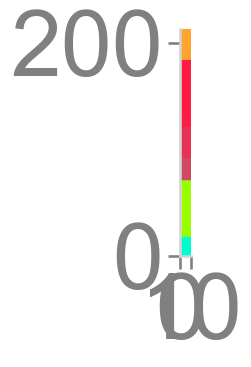

In [40]:
# check color_label

pal_single = pal[0].reshape((1,1,3))
pal_single = np.repeat(pal_single, list(count_map_R.values())[0], axis = 0)
pals = pal_single
for i in range(1,len(pal)):
    pal_single = pal[i].reshape((1,1,3))
    pal_single = np.repeat(pal_single, list(count_map_R.values())[i], axis = 0)
    pals = np.concatenate((pals, pal_single), axis = 0)
pals = pals.reshape(len(pals),1,3)

plt.imshow(pals, extent=(0,10,0,len(pals)))

### L hemi

In [41]:
sizes = meta_L.groupby(["class0"], sort=False).size()
uni_class = sizes.index.unique()
uni_class  # same as H hemi

Index(['PN', 'KC', 'MBIN', 'MBON'], dtype='object', name='class0')

In [42]:
# retrieve colors from cc.glasbey in the order of colors; 
# diff desat so classes in colors[i] have sightly diff colors 

pal = sns.color_palette(palette=colors[0], n_colors=len(colors[0]))

colors_length = [1,3,1,1] # MBON(1) + KC(3) + MBIN(1) + PN(1)
for j in range(len(colors)):
    desats = np.array([1,.8,.6,])
    desats = desats[:colors_length[j]]
    for i in range(len(desats)):
        pal_new = sns.color_palette(palette=colors[j], n_colors=len(colors[j]), desat=desats[i])
        pal = np.concatenate([pal,pal_new], axis=0)
pal = pal[1:]
pal

array([[1.       , 0.647059 , 0.188235 ],
       [1.       , 0.109804 , 0.270588 ],
       [0.9109804, 0.1988236, 0.3274508],
       [0.8219608, 0.2878432, 0.3843136],
       [0.596078 , 1.       , 0.       ],
       [0.       , 0.992157 , 0.811765 ]])

In [43]:
class_label = 'type'
sizes = meta_L.groupby([class_label], sort=False).size()
uni_class = sizes.index.unique()
uni_class  # same as H hemi

Index(['PN', 'young', 'multi claw', 'single claw', 'MBIN', 'MBON'], dtype='object', name='type')

In [44]:
# reorder pal to match the ordering of classes in uni_class

pal_new_L = np.zeros((pal.shape[0], pal.shape[1]))
seq = np.array([5,1,2,3,4,0]) 
for i in range(len(seq)):
    pal_new_L[i,:] = pal[seq[i],:]
pal_new_L

array([[0.       , 0.992157 , 0.811765 ],
       [1.       , 0.109804 , 0.270588 ],
       [0.9109804, 0.1988236, 0.3274508],
       [0.8219608, 0.2878432, 0.3843136],
       [0.596078 , 1.       , 0.       ],
       [1.       , 0.647059 , 0.188235 ]])

In [45]:
counts = sizes.values
count_map_L = dict(zip(uni_class, counts))
count_map_L

{'PN': 58,
 'young': 28,
 'multi claw': 57,
 'single claw': 16,
 'MBIN': 21,
 'MBON': 29}

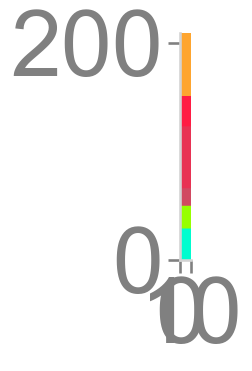

In [46]:
# check color_label

pal_single = pal[0].reshape((1,1,3))
pal_single = np.repeat(pal_single, list(count_map_L.values())[0], axis = 0)
pals = pal_single
for i in range(1,len(pal)):
    pal_single = pal[i].reshape((1,1,3))
    pal_single = np.repeat(pal_single, list(count_map_L.values())[i], axis = 0)
    pals = np.concatenate((pals, pal_single), axis = 0)
pals = pals.reshape(len(pals),1,3)

plt.imshow(pals, extent=(0,10,0,len(pals)))

In [47]:
def plot_color_labels1(meta, ax, xmin, xmax, ymin, ymax, xleft, pal, count_map):
    palplot(xmin,xmax,ymin,ymax,pal, count_map, ax=ax)

    sizes = meta.groupby(["class0"], sort=False).size()
    uni_class = sizes.index.unique()
    counts = sizes.values
    count_map = dict(zip(uni_class, counts))
    names = []
    for key, val in count_map.items():
        names.append(f"{key} ({count_map[key]}/{len(meta)})")
    names = names[::-1]  # reverse because of signal flow sorting
    counts = counts[::-1]

    offsets = np.concatenate([np.zeros(1),np.cumsum(counts)])[:-1]
    slice_length = (ymax-ymin) / len(meta)
    offsets = slice_length * offsets
    for i in range(len(counts)):
        ax.annotate(names[i], xy=(xleft, ymax - offsets[i] - slice_length * counts[i]/2), xycoords='data', rotation=90, va = 'center')

In [48]:
def get_last_mids(label, last_mid_map, max_comp):
    last_mids = []
    if label + "-" in last_mid_map:
        last_mids.append(last_mid_map[label + "-"])
    # if label + "-0" in last_mid_map:
    #     last_mids.append(last_mid_map[label + "-0"])
    # if label + "-1" in last_mid_map:
    #     last_mids.append(last_mid_map[label + "-1"])

    for i in range(max_comp+1):
        if label + f"-{i}" in last_mid_map:
            last_mids.append(last_mid_map[label + f"-{i}"])

    if label in last_mid_map:
        last_mids.append(last_mid_map[label])
    if len(last_mids) == 0:
        print(label + " has no anchor in mid-map")
    return last_mids

In [49]:
def calc_bar_params(sizes, label, mid, color_map, palette=None):
    # if palette is None:
    #     palette = CLASS_COLOR_DICT
    heights = sizes.loc[label]
    n_in_bar = heights.sum()
    offset = mid - n_in_bar / 2
    starts = heights.cumsum() - heights + offset
    # colors = np.vectorize(palette.get)(heights.index)
    colors = [color_map.get(heights.index[n]) for n in range(len(heights))]
    return heights, starts, colors

In [50]:
def draw_bar_dendrogram(
    meta, ax, first_mid_map, class_label, color_map, max_comp, confusion_mat, classes, mat_gap, labels,
    lowest_level=7, width=0.5, draw_labels=False):
    last_mid_map = first_mid_map
    line_kws = dict(linewidth=1, color="k")
    for level in np.arange(lowest_level + 1)[::-1]:
        x = level
        sizes = meta.groupby([f"lvl{level}_labels", class_label], sort=False).size()
        uni_labels = sizes.index.unique(0)  # these need to be in the right order

        mids = []
        for ind, ul in enumerate(uni_labels):
            last_mids = get_last_mids(ul, last_mid_map, max_comp)
            grand_mid = np.mean(last_mids)

            heights, starts, colors = calc_bar_params(sizes, ul, grand_mid, color_map)

            minimum = starts[0]
            maximum = starts[-1] + heights[-1]
            if level == 0:
                maximum_for_labels = maximum
                heights_for_labels = heights
            mid = (minimum + maximum) / 2
            mids.append(mid)

            # draw the bars
            for i in range(len(heights)):
                ax.bar(
                    x=x,
                    height=heights[i],
                    width=width,
                    bottom=starts[i],
                    color=colors[i],
                )
                if (labels is not None) and (level == 0):
                    ax.text(x=-0.7, y=heights[i]/2+starts[i], s=labels[i], rotation=90, va='center')


                if (level == lowest_level) and draw_labels:
                    for j in range(confusion_mat.shape[0]):
                        ax.text(
                            x=lowest_level + mat_gap + 0.3*j, y=mid, s=int(confusion_mat[j,ind]), 
                            verticalalignment="center", rotation=90)
                        ax.text(x=lowest_level + 0.5 + 0.3*j, y=-20, s=classes[j], rotation=90)

            # draw a horizontal line from the middle of this bar
            if level != 0:  # dont plot dash on the last
                ax.plot([x - 0.5 * width, x - width], [mid, mid], **line_kws)

            # line connecting to children clusters
            if level != lowest_level:  # don't plot first dash
                ax.plot(
                    [x + 0.5 * width, x + width], [grand_mid, grand_mid], **line_kws
                )

            # draw a vertical line connecting the two child clusters
            if len(last_mids) > 1:
                #ax.plot([x + width, x + width], last_mids, **line_kws)
                ax.plot(np.repeat([x + width], len(last_mids)), last_mids, **line_kws)

        last_mid_map = dict(zip(uni_labels, mids))
    # remove_spines(ax)
    return maximum_for_labels, heights_for_labels

In [51]:
from src.visualization import get_mid_map

In [52]:
def palplot(xmin,xmax,ymin,ymax,
    pal, count_map, cmap="viridis", figsize=(1, 10), ax=None, start=0, stop=None):
    # if isinstance(k, int):
    #     pal = sns.color_palette(palette=cmap, n_colors=k)
    # else:
    #     pal = k
    k = len(pal)
    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=figsize)
    # pal = np.array(pal)
    # pal = pal.reshape((k, 1, 3))

    pal_single = pal[0].reshape((1,1,3))
    pal_single = np.repeat(pal_single, list(count_map.values())[0], axis = 0)
    pals = pal_single
    for i in range(1,len(pal)):
        pal_single = pal[i].reshape((1,1,3))
        pal_single = np.repeat(pal_single, list(count_map.values())[i], axis = 0)
        pals = np.concatenate((pals, pal_single), axis = 0)
    pals = pals.reshape(len(pals),1,3)[::-1]
    ax.imshow(pals, extent=(xmin,xmax,ymin,ymax))

In [53]:
uni_class

Index(['PN', 'young', 'multi claw', 'single claw', 'MBIN', 'MBON'], dtype='object', name='type')

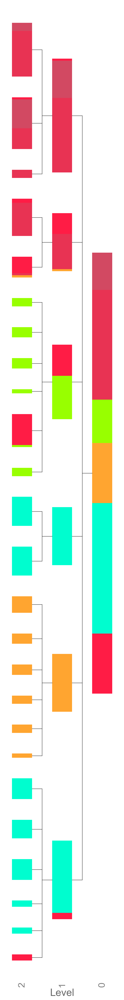

In [91]:
# width_ratios = [0.8,0.2]
lowest_level = 2
sizes = meta_R.groupby(['type'], sort=False).size()
uni_class = sizes.index.unique()
counts = sizes.values
color_map = dict(zip(uni_class, pal_new_R))
fig, ax = plt.subplots(1, figsize=(7, 50))
leaf_key = f"lvl{lowest_level}_labels"
n_leaf = meta_R[leaf_key].nunique()
n_cells = len(meta_R)

first_mid_map = get_mid_map(meta_R, class_label, leaf_key=leaf_key, bilat=True)
gap=10; width=0.5
ax.set_ylim((-gap, (n_cells + gap * n_leaf)))
# ax.set_xlim((-0.5, lowest_level + 1 + 0.5))
# axs[0].set_xlim((-0.5, lowest_level + 0.5))
ax.set_xlim((lowest_level + 0.5, -0.5))  # reversed

maximum_for_labels, heights_for_labels = draw_bar_dendrogram(
    meta_R, ax, first_mid_map, class_label, color_map, mat_gap=0.7, confusion_mat=confusion_matrix_R, classes=["MBON","KC","MBIN","PN"], labels=None,
    lowest_level=lowest_level, draw_labels=False, max_comp=6)

ax.set_yticks([])
ax.set_xticks(np.arange(lowest_level + 1))
ax.tick_params(axis="both", which="both", length=0)
ax.spines["left"].set_visible(False)
ax.spines["bottom"].set_visible(False)
# axs[0].set_xlabel("Level", rotation=90)
ax.set_xlabel("Level")
ax.set_xticklabels(np.arange(lowest_level + 1),rotation=90)

# add a scale bar in the bottom left
# axs[0].bar(x=0, height=10, bottom=0, width=width, color="k")
# axs[0].text(x=0.35, y=0, s="10 neurons", rotation=90)

# xmin = 0.9; xmax = 2; ymin = 0; ymax = len(meta_R); xleft = 2.2
# ymin = -30; ymax = 30
# plot_color_labels1(meta_R, axs[1], xmin, xmax, ymin, ymax, xleft, pal, count_map_R)

# axs[1].set_xlim(0,3)
# axs[1].axis("off")
# for i in range(len(counts)):
#         ax.annotate(names[i], xy=(xleft, ymax - offsets[i] - slice_length * counts[i]/2), xycoords='data', rotation=90, va = 'center')
plt.tight_layout()
# plt.savefig('1-1')

### L hemi

In [54]:
uni_class

Index(['PN', 'young', 'multi claw', 'single claw', 'MBIN', 'MBON'], dtype='object', name='type')

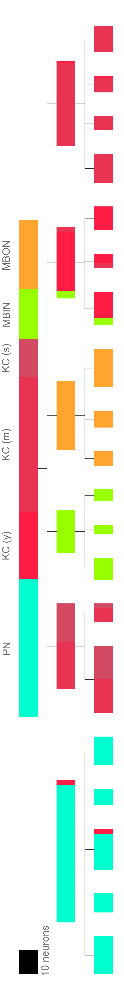

In [89]:
# width_ratios = [0.2,0.8]
lowest_level = 2
sizes = meta_L.groupby(['type'], sort=False).size()
uni_class = sizes.index.unique()
counts = sizes.values
color_map = dict(zip(uni_class, pal_new_L))
fig, ax = plt.subplots(1, figsize=(7, 50))
leaf_key = f"lvl{lowest_level}_labels"
n_leaf = meta_L[leaf_key].nunique()
n_cells = len(meta_L)

first_mid_map = get_mid_map(meta_L, class_label, leaf_key=leaf_key, bilat=True)
gap=10; width=0.5
ax.set_ylim((-gap, (n_cells + gap * n_leaf)))
# ax.set_xlim((-0.5, lowest_level + 1 + 0.5))
ax.set_xlim((-0.5, lowest_level + 0.5))
# axs[0].set_xlim((lowest_level + 0.5, -0.5))  # reversed

maximum_for_labels, heights_for_labels = draw_bar_dendrogram(
    meta_L, ax, first_mid_map, class_label, color_map, mat_gap=0.5, confusion_mat=confusion_matrix_L, classes=["MBON","KC","MBIN","PN"], labels=["PN","KC (y)","KC (m)", "KC (s)", "MBIN", "MBON"],
    lowest_level=lowest_level, draw_labels=False, max_comp=6)

ax.set_yticks([])
ax.set_xticks(np.arange(lowest_level + 1))
ax.tick_params(axis="both", which="both", length=0)
ax.spines["left"].set_visible(False)
ax.spines["bottom"].set_visible(False)
# axs[0].set_xlabel("Level", rotation=90)
ax.set_xlabel("Level")
ax.set_xticklabels(np.arange(lowest_level + 1),rotation=90)

# add a scale bar in the bottom left
ax.bar(x=0, height=10, bottom=0, width=width, color="k")
ax.text(x=0.35, y=0, s="10 neurons", rotation=90)

# xmin = 0.9; xmax = 2; ymin = 0; ymax = len(meta_L); xleft = 2.2
# ymin = -30; ymax = 30
# axs[0].set_xlim((-3, None))
# plot_color_labels1(meta_L, axs[0], xmin, xmax, ymin, ymax, xleft, pal, count_map_L)

# ax.set_xlim(-0.2,3)
ax.axis("off")
plt.tight_layout()
# plt.savefig('1-2')

### both hemi

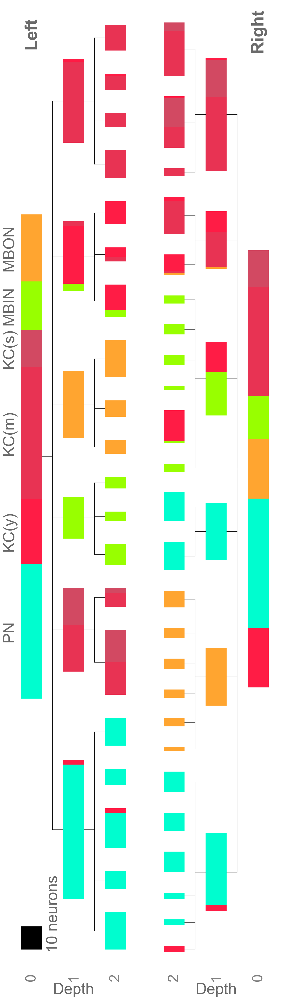

In [58]:
width_ratios = [0.5,0.5]
lowest_level = 2
fig, axs = plt.subplots(
    1, 2, figsize=(15, 50), gridspec_kw=dict(width_ratios=width_ratios)
)

# L
sizes = meta_L.groupby(['type'], sort=False).size()
uni_class = sizes.index.unique()
counts = sizes.values
color_map = dict(zip(uni_class, pal_new_L))
leaf_key = f"lvl{lowest_level}_labels"
n_leaf = meta_L[leaf_key].nunique()
n_cells = len(meta_L)
first_mid_map = get_mid_map(meta_L, class_label, leaf_key=leaf_key, bilat=True)
gap=10; width=0.5
ax = axs[0]
ax.set_ylim((-gap, (n_cells + gap * n_leaf)))
ax.set_xlim((-0.5, lowest_level + 0.5))

maximum_for_labels, heights_for_labels = draw_bar_dendrogram(
    meta_L, ax, first_mid_map, class_label, color_map, mat_gap=0.4, confusion_mat=confusion_matrix_L, classes=["MBON","KC","MBIN","PN"], labels=["PN","KC(y)","KC(m)", "KC(s)", "MBIN", "MBON"],
    lowest_level=lowest_level, draw_labels=False, max_comp=6)

ax.set_yticks([])
ax.set_xticks(np.arange(lowest_level + 1))
ax.tick_params(axis="both", which="both", length=0)
ax.spines["left"].set_visible(False)
ax.spines["bottom"].set_visible(False)
ax.set_xlabel("Depth")
ax.set_xticklabels(np.arange(lowest_level + 1),rotation=90)
ax.bar(x=0, height=10, bottom=0, width=width, color="k")  # add a scale bar in the bottom left
ax.text(x=0.35, y=0, s="10 neurons", rotation=90)
t = ax.text(x=0, y=390, s="Left", rotation=90, fontsize=60, fontweight="bold", ha='center')
# t.set_bbox(dict(facecolor='gray', alpha=0.2, edgecolor='gray'))

# R
sizes = meta_R.groupby(['type'], sort=False).size()
uni_class = sizes.index.unique()
counts = sizes.values
color_map = dict(zip(uni_class, pal_new_R))
leaf_key = f"lvl{lowest_level}_labels"
n_leaf = meta_R[leaf_key].nunique()
n_cells = len(meta_R)
first_mid_map = get_mid_map(meta_R, class_label, leaf_key=leaf_key, bilat=True)
gap=10; width=0.5
ax = axs[1]
ax.set_ylim((-gap, (n_cells + gap * n_leaf)))
ax.set_xlim((lowest_level + 0.5, -0.5))  # reversed

maximum_for_labels, heights_for_labels = draw_bar_dendrogram(
    meta_R, ax, first_mid_map, class_label, color_map, mat_gap=0.6, confusion_mat=confusion_matrix_R, classes=["MBON","KC","MBIN","PN"], labels=None,
    lowest_level=lowest_level, draw_labels=False, max_comp=6)

ax.set_yticks([])
ax.set_xticks(np.arange(lowest_level + 1))
ax.tick_params(axis="both", which="both", length=0)
ax.spines["left"].set_visible(False)
ax.spines["bottom"].set_visible(False)
ax.set_xlabel("Depth")
ax.set_xticklabels(np.arange(lowest_level + 1),rotation=90)
t = ax.text(x=0, y=440, s="Right", rotation=90, fontsize=60, fontweight="bold", ha='center')
# t.set_bbox(dict(facecolor='gray', alpha=0.2, edgecolor='gray'))


plt.subplots_adjust(hspace=0)
plt.tight_layout()
plt.savefig('maggot_dendrograms_new', bbox_inches='tight')

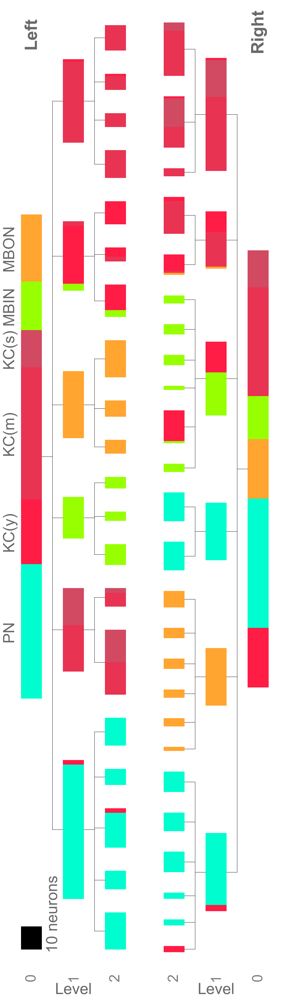

In [62]:
width_ratios = [0.5,0.5]
lowest_level = 2
fig, axs = plt.subplots(
    1, 2, figsize=(15, 50), gridspec_kw=dict(width_ratios=width_ratios)
)

# L
sizes = meta_L.groupby(['type'], sort=False).size()
uni_class = sizes.index.unique()
counts = sizes.values
color_map = dict(zip(uni_class, pal_new_L))
leaf_key = f"lvl{lowest_level}_labels"
n_leaf = meta_L[leaf_key].nunique()
n_cells = len(meta_L)
first_mid_map = get_mid_map(meta_L, class_label, leaf_key=leaf_key, bilat=True)
gap=10; width=0.5
ax = axs[0]
ax.set_ylim((-gap, (n_cells + gap * n_leaf)))
ax.set_xlim((-0.5, lowest_level + 0.5))

maximum_for_labels, heights_for_labels = draw_bar_dendrogram(
    meta_L, ax, first_mid_map, class_label, color_map, mat_gap=0.4, confusion_mat=confusion_matrix_L, classes=["MBON","KC","MBIN","PN"], labels=["PN","KC(y)","KC(m)", "KC(s)", "MBIN", "MBON"],
    lowest_level=lowest_level, draw_labels=False, max_comp=6)

ax.set_yticks([])
ax.set_xticks(np.arange(lowest_level + 1))
ax.tick_params(axis="both", which="both", length=0)
ax.spines["left"].set_visible(False)
ax.spines["bottom"].set_visible(False)
ax.set_xlabel("Level")
ax.set_xticklabels(np.arange(lowest_level + 1),rotation=90)
ax.bar(x=0, height=10, bottom=0, width=width, color="k")  # add a scale bar in the bottom left
ax.text(x=0.35, y=0, s="10 neurons", rotation=90)
t = ax.text(x=0, y=390, s="Left", rotation=90, fontsize=60, fontweight="bold", ha='center')
# t.set_bbox(dict(facecolor='gray', alpha=0.2, edgecolor='gray'))

# R
sizes = meta_R.groupby(['type'], sort=False).size()
uni_class = sizes.index.unique()
counts = sizes.values
color_map = dict(zip(uni_class, pal_new_R))
leaf_key = f"lvl{lowest_level}_labels"
n_leaf = meta_R[leaf_key].nunique()
n_cells = len(meta_R)
first_mid_map = get_mid_map(meta_R, class_label, leaf_key=leaf_key, bilat=True)
gap=10; width=0.5
ax = axs[1]
ax.set_ylim((-gap, (n_cells + gap * n_leaf)))
ax.set_xlim((lowest_level + 0.5, -0.5))  # reversed

maximum_for_labels, heights_for_labels = draw_bar_dendrogram(
    meta_R, ax, first_mid_map, class_label, color_map, mat_gap=0.6, confusion_mat=confusion_matrix_R, classes=["MBON","KC","MBIN","PN"], labels=None,
    lowest_level=lowest_level, draw_labels=False, max_comp=6)

ax.set_yticks([])
ax.set_xticks(np.arange(lowest_level + 1))
ax.tick_params(axis="both", which="both", length=0)
ax.spines["left"].set_visible(False)
ax.spines["bottom"].set_visible(False)
ax.set_xlabel("Depth")
ax.set_xticklabels(np.arange(lowest_level + 1),rotation=90)
t = ax.text(x=0, y=440, s="Right", rotation=90, fontsize=60, fontweight="bold", ha='center')
# t.set_bbox(dict(facecolor='gray', alpha=0.2, edgecolor='gray'))


plt.subplots_adjust(hspace=0)
plt.tight_layout()
# plt.savefig('maggot_dendrograms', bbox_inches='tight')